In [21]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import os
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
def load_fused_embeddings(obverse=True):

    extension = "ob" if obverse else "rev"

    embeddings = np.load(f"fused_embeddings_{extension}.npy")
    with open(f"fused_filenames_{extension}.txt", "r") as f:
        filenames = [line.strip() for line in f]
    with open(f"fused_base_texts_{extension}.txt", "r") as f:
        base_texts = [line.strip() for line in f]

    return embeddings, filenames, base_texts

In [3]:
def load_image_embeddings(obverse=True, grayscale=False):

    prefix = "obverse" if obverse else "reverse"
    suffix = "_gray" if grayscale else ""

    embeddings = np.load(f"{prefix}_features{suffix}.npy")
    with open(f"{prefix}_filenames{suffix}.txt", "r") as f:
        filenames = [line.strip() for line in f]

    return embeddings, filenames

In [8]:
fused_embs_ob, fused_filenames_ob, fused_texts_ob = load_fused_embeddings(obverse=True)
fused_embs_rev, fused_filenames_rev, fused_texts_rev = load_fused_embeddings(obverse=False)

In [9]:
image_embs_ob, image_filenames_ob = load_image_embeddings(obverse=True, grayscale=True)
image_embs_rev, image_filenames_rev = load_image_embeddings(obverse=False, grayscale=True)

In [10]:
fused_embs_ob.shape

(741, 128)

In [11]:
image_embs_ob.shape

(741, 2048)

In [13]:
fused_embs_rev.shape

(740, 128)

In [14]:
image_embs_rev.shape

(740, 2048)

In [16]:
def compute_similarity_matrix(embeddings, filenames):

    similarity_matrix = cosine_similarity(embeddings)
    return similarity_matrix, filenames

In [17]:
def get_top_similar_images(query_idx, similarity_matrix, filenames, top_n=5):

    similarities = similarity_matrix[query_idx]
    
    sorted_indices = np.argsort(similarities)[::-1]
    top_indices = sorted_indices[1:top_n + 1]  # Skip the first one (itself)

    # Return filenames and their corresponding similarity scores
    return [(filenames[i], similarities[i]) for i in top_indices]


In [18]:
similarity_matrix_ob_fused, filenames_ob_fused = compute_similarity_matrix(fused_embs_ob, fused_filenames_ob)

In [19]:
query_index = 0
top_similar_images = get_top_similar_images(query_index, similarity_matrix_ob_fused, filenames_ob_fused, top_n=3)
print(f"Query Image: {filenames_ob_fused[query_index]}")
for filename, score in top_similar_images:
    print(f"Similar Image: {filename}, Similarity Score: {score:.4f}")

Query Image: 00012a00.jpg
Similar Image: MC0503_a.jpg, Similarity Score: 0.9998
Similar Image: MC0763_a.jpg, Similarity Score: 0.9996
Similar Image: K0434_a.jpg, Similarity Score: 0.9995


In [ ]:
def get_most_and_least_similar_images(query_idx, similarity_matrix, filenames, top_n=3):

    similarities = similarity_matrix[query_idx]  # Get similarity scores for the query
    sorted_indices = np.argsort(similarities)[::-1]  # Sort indices in descending order

    # Most similar (excluding self)
    most_similar_indices = sorted_indices[1:top_n + 1]
    most_similar_images = [(filenames[i], similarities[i]) for i in most_similar_indices]

    # Least similar
    least_similar_indices = sorted_indices[-top_n:]
    least_similar_images = [(filenames[i], similarities[i]) for i in least_similar_indices]

    query_filename = filenames[query_idx]

    return query_filename, most_similar_images, least_similar_images

In [32]:
def show_similar_and_dissimilar_images(query_filename, most_similar, least_similar, image_dir):

    num_similar = len(most_similar)
    num_dissimilar = len(least_similar)
    
    fig, axes = plt.subplots(2, max(num_similar, num_dissimilar) + 1, figsize=(4 * (max(num_similar, num_dissimilar) + 1), 8))

    # Load and show query image (leftmost column)
    query_path = os.path.join(image_dir, query_filename)
    query_image = Image.open(query_path)

    axes[0, 0].imshow(query_image)
    axes[0, 0].set_title(f"Query Image\n{query_filename}")
    axes[0, 0].axis("off")

    axes[1, 0].axis("off")  # Leave the bottom-left corner empty

    # Show most similar images in the top row
    for i, (sim_filename, sim_score) in enumerate(most_similar):
        img_path = os.path.join(image_dir, sim_filename)
        try:
            img = Image.open(img_path)
            axes[0, i + 1].imshow(img)
            axes[0, i + 1].set_title(f"Similar {i+1}\n{sim_filename}\nScore: {sim_score:.5f}")
            axes[0, i + 1].axis("off")
        except FileNotFoundError:
            print(f"Image {sim_filename} not found in {image_dir}")

    # Show least similar images in the bottom row
    for i, (dissim_filename, dissim_score) in enumerate(least_similar):
        img_path = os.path.join(image_dir, dissim_filename)
        try:
            img = Image.open(img_path)
            axes[1, i + 1].imshow(img)
            axes[1, i + 1].set_title(f"Dissimilar {i+1}\n{dissim_filename}\nScore: {dissim_score:.5f}")
            axes[1, i + 1].axis("off")
        except FileNotFoundError:
            print(f"Image {dissim_filename} not found in {image_dir}")

    # Adjust layout
    plt.tight_layout()
    plt.show()

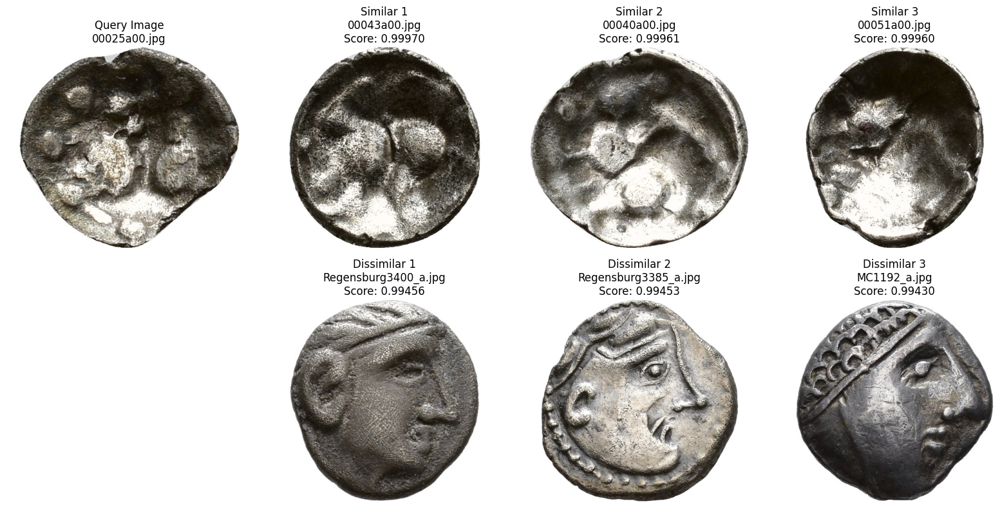

In [38]:
query_filename, most_similar_images, least_similar_images = get_most_and_least_similar_images(5, 
                                                                                              similarity_matrix_ob_fused, 
                                                                                              filenames_ob_fused, top_n=3)
image_dir = "F:/data_ba/kleinsilber_linz/kleinsilber_linz/obverse"
show_similar_and_dissimilar_images(query_filename, most_similar_images, least_similar_images, image_dir)

In [39]:
similarity_matrix_ob_not_fused, files_names_not_fused = compute_similarity_matrix(image_embs_ob, image_filenames_ob)

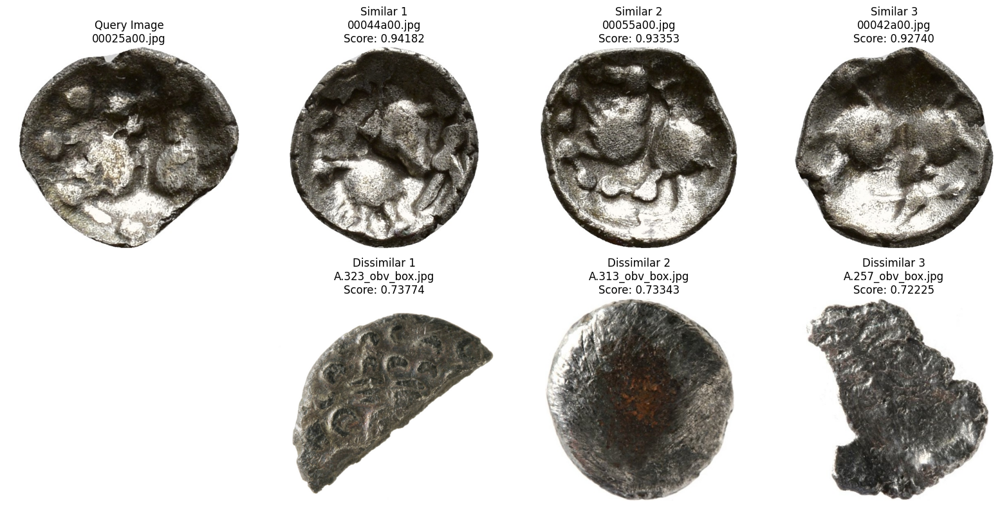

In [40]:
query_filename, most_similar_images, least_similar_images = get_most_and_least_similar_images(5, 
                                                                                              similarity_matrix_ob_not_fused, 
                                                                                              files_names_not_fused, top_n=3)
image_dir = "F:/data_ba/kleinsilber_linz/kleinsilber_linz/obverse"
show_similar_and_dissimilar_images(query_filename, most_similar_images, least_similar_images, image_dir)

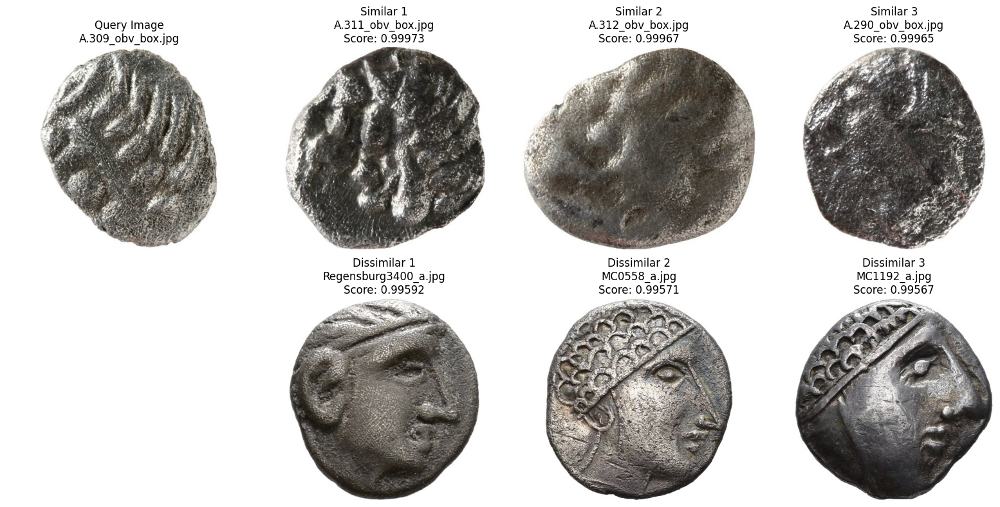

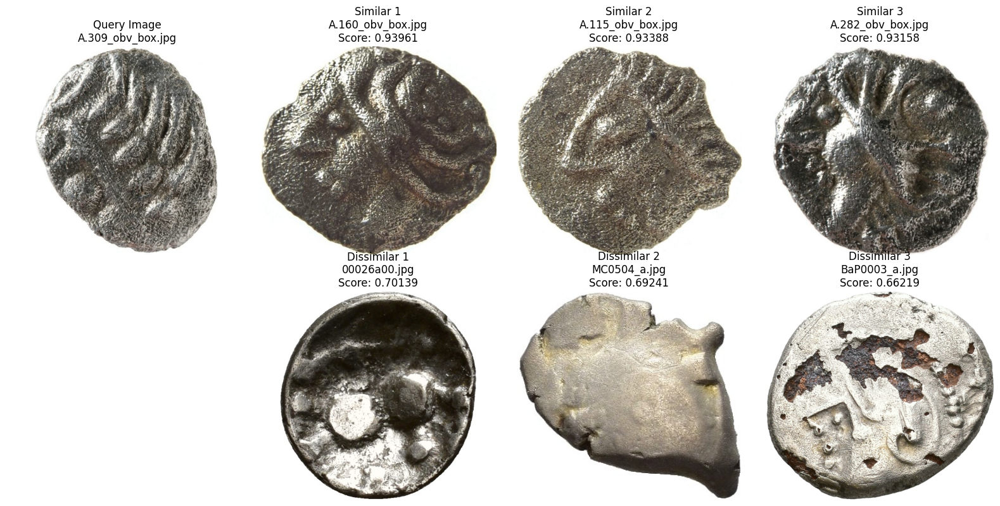

In [41]:
query_filename, most_similar_images, least_similar_images = get_most_and_least_similar_images(254, 
                                                                                              similarity_matrix_ob_fused, 
                                                                                              filenames_ob_fused, top_n=3)
image_dir = "F:/data_ba/kleinsilber_linz/kleinsilber_linz/obverse"
show_similar_and_dissimilar_images(query_filename, most_similar_images, least_similar_images, image_dir)

query_filename, most_similar_images, least_similar_images = get_most_and_least_similar_images(254, 
                                                                                              similarity_matrix_ob_not_fused, 
                                                                                              files_names_not_fused, top_n=3)
image_dir = "F:/data_ba/kleinsilber_linz/kleinsilber_linz/obverse"
show_similar_and_dissimilar_images(query_filename, most_similar_images, least_similar_images, image_dir)

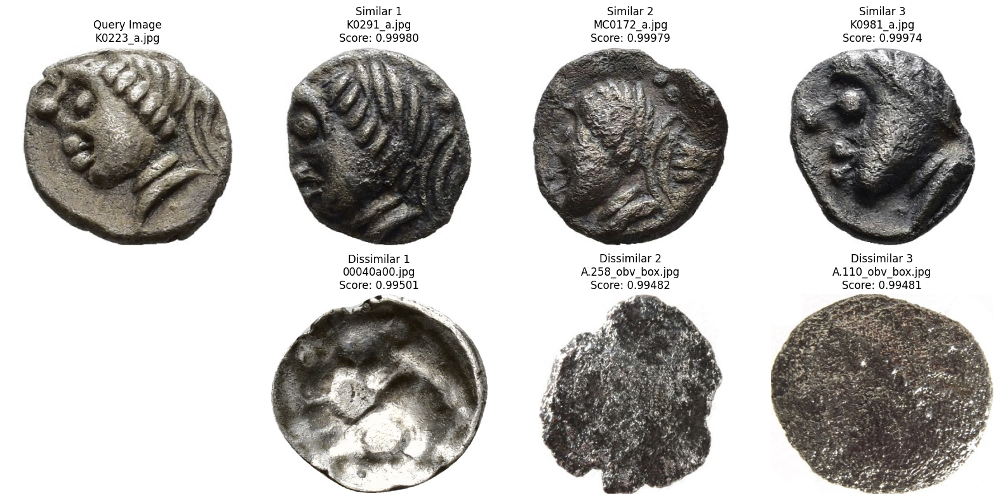

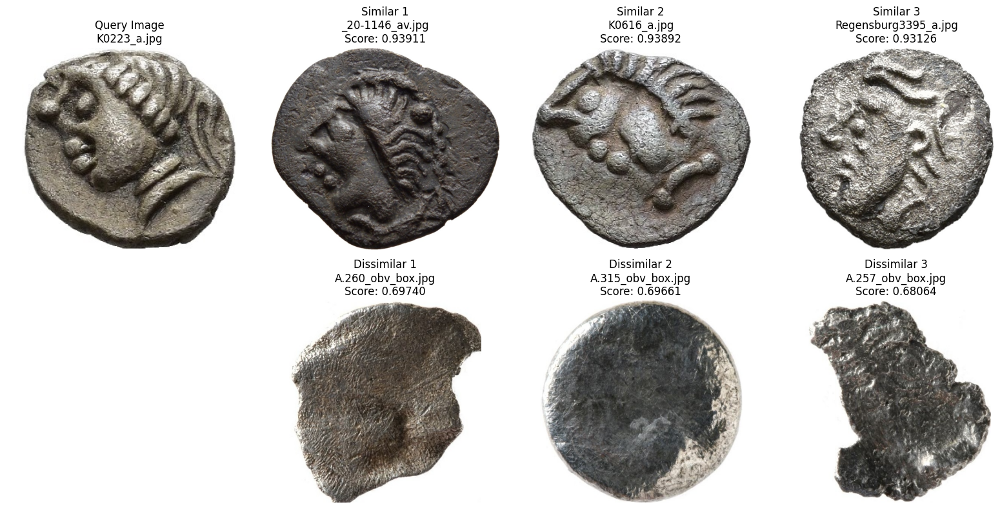

In [43]:
query_filename, most_similar_images, least_similar_images = get_most_and_least_similar_images(346, 
                                                                                              similarity_matrix_ob_fused, 
                                                                                              filenames_ob_fused, top_n=3)
image_dir = "F:/data_ba/kleinsilber_linz/kleinsilber_linz/obverse"
show_similar_and_dissimilar_images(query_filename, most_similar_images, least_similar_images, image_dir)

query_filename, most_similar_images, least_similar_images = get_most_and_least_similar_images(346, 
                                                                                              similarity_matrix_ob_not_fused, 
                                                                                              files_names_not_fused, top_n=3)
image_dir = "F:/data_ba/kleinsilber_linz/kleinsilber_linz/obverse"
show_similar_and_dissimilar_images(query_filename, most_similar_images, least_similar_images, image_dir)